<a href="https://colab.research.google.com/github/sunrita007/MachineLearning_MiniProject/blob/main/MLEnd_2022_Starter_kit__Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1 Author

**Student Name**:  Sunrita Sarkar
**Student ID**:  220746443


# 2 Problem formulation

Describe the machine learning problem that you want to solve and explain what's interesting about it. 

**The problem stattement we are trying to solve here is whether an audio file belongs to the canal side or not. The canal side is an area in nature and is viable of having sounds very different from streets and crowded enclosed areas**

# 3 Machine Learning pipeline

Describe your ML pipeline. Clearly identify its input and output, any intermediate stages (for instance, transformation -> models), and intermediate data moving from one stage to the next. It's up to you to decide which stages to include in your pipeline. 

**bold text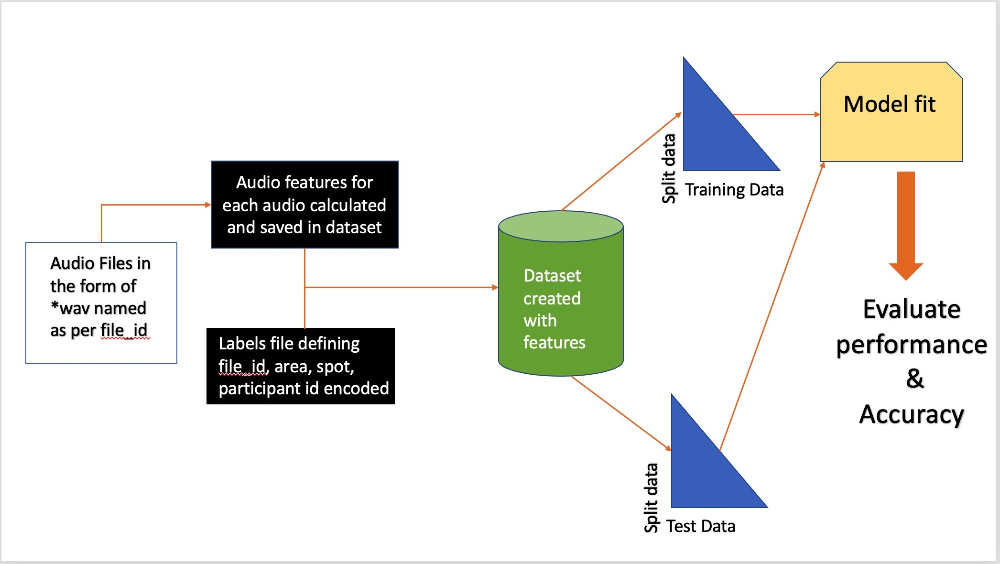**

# Environment set up

In this section we will set up a Colab environment for the MLEnd mini-project. Before starting, follow these simple instructions: 

1.   Go to https://drive.google.com/
2.   Create a folder named 'Data' in 'MyDrive': On the left, click 'New' > 'Folder', enter the name 'Data', and click 'create'
3.   Open the 'Data' folder and create a folder named 'MLEndLS'.

Let's start by loading a few useful Python libraries and mounting our personal Google Drive storage system (i.e. making it available, so that Colab can access it).

In [157]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data download

In this section we will download a small subsample of the MLEnd London Sounds Dataset. 

You should be able to download the entire training dataset when it is made available using a similar approach to the one used here for the small sample. As you will see, you only need to provide a different link. Please note that even though we call it "training" dataset you can do whatever you want with it (for instance validate a set of models). We have kept a separate private dataset for testing purposes, which we won't share with anyone.

First, let's define a function that will allow us to download a file into a chosen location.

In [158]:
def download_url(url, save_path):
    with urllib.request.urlopen(url) as dl_file:
        with open(save_path, 'wb') as out_file:
            out_file.write(dl_file.read())

The next step is to download the file 'MLEndLS_Sample.zip' into the folder 'MyDrive/Data/MLEndLS'. Note that this might take a while!

In [159]:
#url  = "https://collect.qmul.ac.uk/down?t=610I73D2G2RLS4BI/R8RDLM2R3O9FHEMR92GKGR0"
#save_path = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_Sample.zip'
#download_url(url, save_path)

Run the following cell to check that the MLEndLS folder contains the file 'MLEndLS_Sample.zip':

In [160]:
path = '/content/drive/MyDrive/Data/MLEndLS'
os.listdir(path)

['1500.wav',
 '1501.wav',
 '1502.wav',
 '1503.wav',
 '1504.wav',
 '1505.wav',
 '1506.wav',
 '1507.wav',
 '1508.wav',
 '1509.wav',
 '1510.wav',
 '1511.wav',
 '1512.wav',
 '1513.wav',
 '1514.wav',
 '1515.wav',
 '1516.wav',
 '1517.wav',
 '1518.wav',
 '1519.wav',
 '1520.wav',
 '1521.wav',
 '1522.wav',
 '1523.wav',
 '1524.wav',
 '1525.wav',
 '1526.wav',
 '1527.wav',
 '1528.wav',
 '1529.wav',
 '1530.wav',
 '1531.wav',
 '1532.wav',
 '1533.wav',
 '1534.wav',
 '1535.wav',
 '1536.wav',
 '1537.wav',
 '1538.wav',
 '1539.wav',
 '1540.wav',
 '1541.wav',
 '1542.wav',
 '1543.wav',
 '1544.wav',
 '1545.wav',
 '1546.wav',
 '1547.wav',
 '1548.wav',
 '1549.wav',
 '1550.wav',
 '1551.wav',
 '1552.wav',
 '1553.wav',
 '1554.wav',
 '1555.wav',
 '1556.wav',
 '1557.wav',
 '1558.wav',
 '1559.wav',
 '1560.wav',
 '1561.wav',
 '1562.wav',
 '1563.wav',
 '1564.wav',
 '1565.wav',
 '1566.wav',
 '1567.wav',
 '1568.wav',
 '1569.wav',
 '1570.wav',
 '1571.wav',
 '1572.wav',
 '1573.wav',
 '1574.wav',
 '1575.wav',
 '1576.wav',

# Understanding our dataset sample

Let's unzip the sample data:

In [161]:
#directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndLS/'
#zip_path1 = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_1.zip'
#zip_path2 = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_2.zip'
#zip_path3 = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_3.zip'
#zip_path4 = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_4.zip'
#zip_path5 = '/content/drive/MyDrive/Data/MLEndLS/MLEndLS_5.zip'
#with zipfile.ZipFile(zip_path1, 'r') as zip_ref1:
#    zip_ref1.extractall(directory_to_extract_to)
#with zipfile.ZipFile(zip_path2, 'r') as zip_ref2:
#    zip_ref2.extractall(directory_to_extract_to)
#with zipfile.ZipFile(zip_path3, 'r') as zip_ref3:
#    zip_ref3.extractall(directory_to_extract_to)
#with zipfile.ZipFile(zip_path4, 'r') as zip_ref4:
#    zip_ref4.extractall(directory_to_extract_to)
#with zipfile.ZipFile(zip_path5, 'r') as zip_ref5:
#    zip_ref5.extractall(directory_to_extract_to)


And now check how many audio files we have:

In [162]:
sample_path = '/content/drive/MyDrive/Data/MLEndLS/*.wav'
files = glob.glob(sample_path)
len(files)

2498

This figure (100) corresponds to the number of **items** or **samples** in our dataset. Let's listen to some random audio files:

In [163]:
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

Can you recognise the filming spot? What can you say about the acoustic environment?

The MLEndLS Dataset is a collection of samples described by 5 attributes:
- Audio
- Area
- Spot
- Whether indoor or outdoor
- Participant

Upload the CSV file 'MLEndLS_Sample.csv'. Then run the next cell to load it into a Pandas DataFrame and print its contents.


In [164]:
MLENDLS_df = pd.read_csv('./MLEndLS.csv').set_index('file_id') 
MLENDLS_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


Text(0, 0.5, 'Frequency')

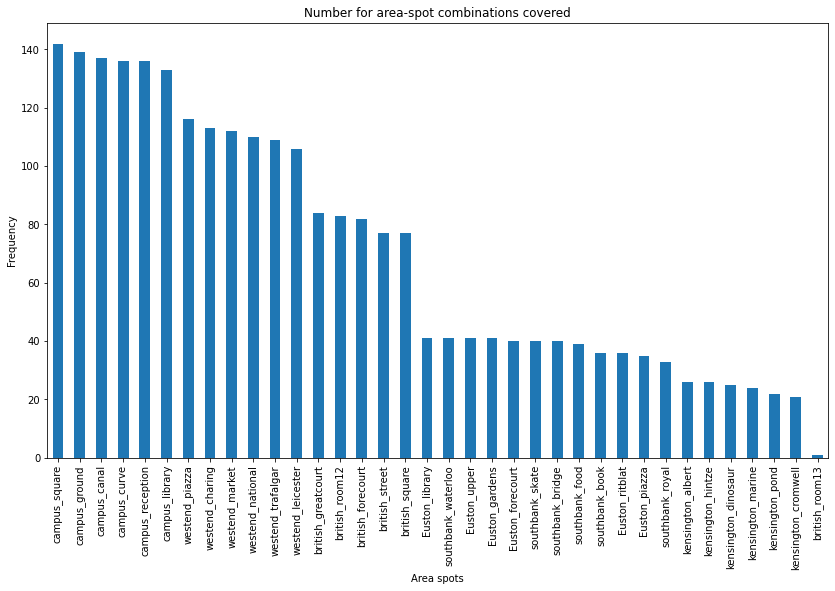

In [165]:
MLENDLS_df['area_spot'] = MLENDLS_df['area'] + "_" + MLENDLS_df['spot']
#MLENDLS_df['area_spot'].value_counts()
ax = MLENDLS_df['area_spot'].value_counts().plot(kind='bar',
                                    figsize=(14,8),
                                    title="Number for area-spot combinations covered")
ax.set_xlabel("Area spots")
ax.set_ylabel("Frequency")

Text(0, 0.5, 'Frequency')

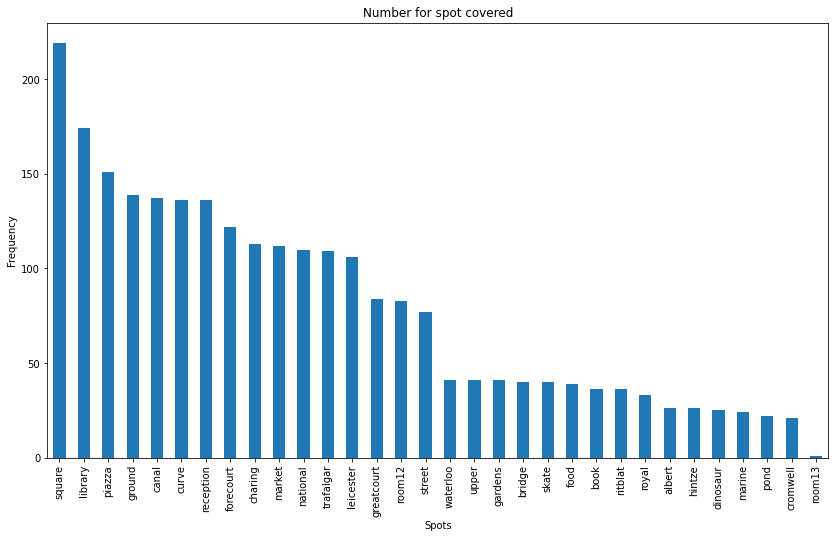

In [166]:
#MLENDLS_df['area_spot'].value_counts()
ax = MLENDLS_df['spot'].value_counts().plot(kind='bar',
                                    figsize=(14,8),
                                    title="Number for spot covered")
ax.set_xlabel("Spots")
ax.set_ylabel("Frequency")

In [167]:
MLENDLS_df['area'].unique()

array(['british', 'kensington', 'campus', 'westend', 'Euston',
       'southbank'], dtype=object)

In [168]:
MLENDLS_df['spot'].unique()

array(['street', 'dinosaur', 'square', 'hintze', 'piazza', 'upper',
       'canal', 'forecourt', 'greatcourt', 'reception', 'leicester',
       'waterloo', 'room12', 'pond', 'national', 'library', 'skate',
       'market', 'book', 'ground', 'charing', 'trafalgar', 'curve',
       'ritblat', 'bridge', 'marine', 'food', 'albert', 'cromwell',
       'gardens', 'royal', 'room13'], dtype=object)

##4 Transformation stage

Describe any transformations, such as feature extraction. Identify input and output. Explain why you have chosen this transformation stage

We have used the geolocations as predictors as it allows us an edge if we want to use a KNN clustering model

In [169]:
from sklearn.preprocessing import LabelBinarizer
df = MLENDLS_df.copy()
result_df = pd.get_dummies(df,
                           columns = ['area','in_out','spot'])  
display(result_df)

,Participant,area_spot,area_Euston,area_british,area_campus,area_kensington,area_southbank,area_westend,in_out_indoor,in_out_outdoor,...,spot_ritblat,spot_room12,spot_room13,spot_royal,spot_skate,spot_square,spot_street,spot_trafalgar,spot_upper,spot_waterloo
file_id,,,,,,,,,,,,,,,,,,,,,
0001.wav,S151,british_street,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
0002.wav,S127,kensington_dinosaur,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
0003.wav,S18,campus_square,0,0,1,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
0004.wav,S179,kensington_hintze,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
0005.wav,S176,campus_square,0,0,1,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2496.wav,S151,westend_trafalgar,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,1,0,0
2497.wav,S6,campus_square,0,0,1,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
2498.wav,S96,westend_national,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0


In [170]:
result_df.columns

Index(['Participant', 'area_spot', 'area_Euston', 'area_british',
       'area_campus', 'area_kensington', 'area_southbank', 'area_westend',
       'in_out_indoor', 'in_out_outdoor', 'spot_albert', 'spot_book',
       'spot_bridge', 'spot_canal', 'spot_charing', 'spot_cromwell',
       'spot_curve', 'spot_dinosaur', 'spot_food', 'spot_forecourt',
       'spot_gardens', 'spot_greatcourt', 'spot_ground', 'spot_hintze',
       'spot_leicester', 'spot_library', 'spot_marine', 'spot_market',
       'spot_national', 'spot_piazza', 'spot_pond', 'spot_reception',
       'spot_ritblat', 'spot_room12', 'spot_room13', 'spot_royal',
       'spot_skate', 'spot_square', 'spot_street', 'spot_trafalgar',
       'spot_upper', 'spot_waterloo'],
      dtype='object')

In [171]:
result_df.describe()

,area_Euston,area_british,area_campus,area_kensington,area_southbank,area_westend,in_out_indoor,in_out_outdoor,spot_albert,spot_book,...,spot_ritblat,spot_room12,spot_room13,spot_royal,spot_skate,spot_square,spot_street,spot_trafalgar,spot_upper,spot_waterloo
count,2500.00000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,...,2500.000000,2500.000000,2500.0000,2500.000000,2500.0000,2500.000000,2500.00000,2500.000000,2500.000000,2500.000000
mean,0.09360,0.161600,0.329200,0.057600,0.091600,0.266400,0.472400,0.527600,0.010400,0.014400,...,0.014400,0.033200,0.0004,0.013200,0.0160,0.087600,0.03080,0.043600,0.016400,0.016400
std,0.29133,0.368157,0.470017,0.233032,0.288518,0.442164,0.499338,0.499338,0.101469,0.119157,...,0.119157,0.179194,0.0200,0.114153,0.1255,0.282769,0.17281,0.204244,0.127033,0.127033
min,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0000,0.000000,0.0000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0000,0.000000,0.0000,0.000000,0.00000,0.000000,0.000000,0.000000
50%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.0000,0.000000,0.0000,0.000000,0.00000,0.000000,0.000000,0.000000
75%,0.00000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.0000,0.000000,0.0000,0.000000,0.00000,0.000000,0.000000,0.000000
max,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.0000,1.000000,1.0000,1.000000,1.00000,1.000000,1.000000,1.000000


In [172]:
result_df = result_df.drop(["Participant",	"area_spot"], axis = 1)
result_df.head(10)

,area_Euston,area_british,area_campus,area_kensington,area_southbank,area_westend,in_out_indoor,in_out_outdoor,spot_albert,spot_book,...,spot_ritblat,spot_room12,spot_room13,spot_royal,spot_skate,spot_square,spot_street,spot_trafalgar,spot_upper,spot_waterloo
file_id,,,,,,,,,,,,,,,,,,,,,
0001.wav,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
0002.wav,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0003.wav,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
0004.wav,0,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0005.wav,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
0006.wav,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
0007.wav,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
0008.wav,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
0009.wav,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


The audio attribute is a complex one and cannot be directly inserted in a DataFrame structure. Instead, we have the name of the corresponding audio files, e.g. '3086.wav', which in our case are stored in the '/content/drive/MyDrive/Data/MLEndLS/sample/MLEndLS_Sample/' folder. 

The next cell prints the contents of the folder that stores our sample audio files. You can see that the names of the WAV files correspond to one of the `file_id` entries in the `MLEndLS_df` DataFrame.

In [173]:
for file in files:
  print(file.split('/')[-1][10:50])

# Feature extraction : Spectral Centroid

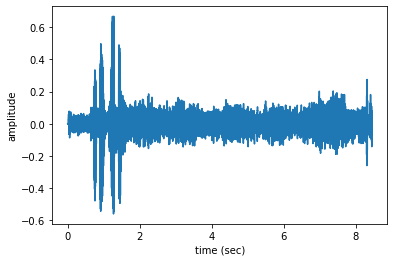

In [174]:
import librosa
n=0
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

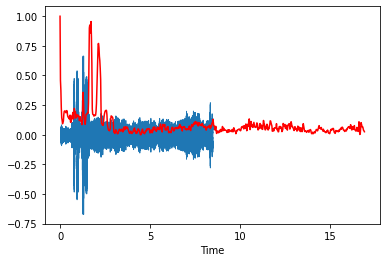

In [175]:
#spectral centroid -- centre of mass -- weighted mean of the frequencies present in the sound
import sklearn
import librosa.display
spectral_centroids = librosa.feature.spectral_centroid(x, sr= fs)[0]
spectral_centroids.shape
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveshow(x, fs)
plt.plot(t, normalize(spectral_centroids), color='r')

# Feature extraction : Spectral Roll off


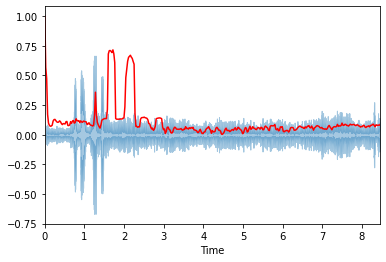

In [176]:
spectral_rolloff = librosa.feature.spectral_rolloff(x, sr=fs)[0]
librosa.display.waveplot(x, sr=fs, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

# Feature extraction : MFCC


(20, 728)


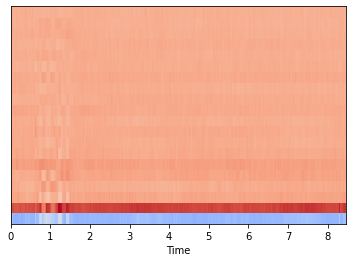

In [177]:
mfccs = librosa.feature.mfcc(x, sr=fs)
print(mfccs.shape)
#Displaying  the MFCCs:
librosa.display.specshow(mfccs, sr=fs, x_axis='time')

Can you tell whether you are listening to an indoors or outdoors location? Does it agree with the values shown in the ``` MLENDLS_df ``` dataframe? Let's check it:
 

In [178]:
MLENDLS_df.loc[files[n].split('/')[-1]]

area                  campus
spot                  square
in_out               outdoor
Participant             S141
area_spot      campus_square
Name: 1500.wav, dtype: object

Note that we are using the name of the audio file as the index in the Pandas DataFrame. By changing the value of `n` in the previous cell, you can listen to other examples. If you are doing this during one of our lab sessions, please make sure that your mic is muted!

Exactly, how complex is an audio signal? Let's start by looking at the number of samples (i.e. time series samples) in one of our audio files:

In [179]:
import librosa
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 372644 samples


#Feature Extraction : Pitch


Audio files are complex data types. Specifically they are **discrete signals** or **time series**, consisting of values on a 1D temporal grid. These values are known as *samples* themselves, which might be a bit confusing, as we have used this term to refer to the *items* in our dataset. The **sampling frequency** is the rate at which samples in an audio file are produced. For instance a sampling frequency of 5HZ indicates that 5 produce 5 samples per second, or 1 sample every 0.2 s.

Let's plot one of our audio signals:

If we are using a raw audio signal as the input of a machine learning model, we will be operating in a predictor space consisting of hundreds of thousands of dimensions. Compare this figure with the number of items (i.e. recordings) that we have. Do we have enough samples to train a model that takes one of these audio signals as an input?

One approach to deal with this huge dimensionality is to extract a few features from our signals and use these features as predictors instead. In this notebook we will use four audio features, namely:


1.   Power.
2.   Pitch - mean.
3.   Pitch - standard deviation.
4.   Fraction of voiced region.

In the next cell, we define a new function that gets the pitch of an audio signal (do not worry if you do not know what it is, but feel free to read about it!).

In [180]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

Let's consider the problem of determining whether the filming spot is canal side or otherwise. Then next cell defines a function that takes a collection of audio files together with a CSV file and creates a dataset containing the  features used as predictors (`data`) and a binary label (`y`) that indicates whether the recording is by the canal side (`y=1`) or not (`y=0`).

#Formulating features as predictors

In [181]:
import numpy as np
import csv
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X = []
  y = []
  y2 = []
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    yi = labels_file.loc[fileID]['spot_canal']== 1
    try:
      fs = None # if None, fs would be 22050
      x, fs = librosa.load(file,sr=fs)
      if scale_audio: x = x/np.max(np.abs(x))
      f0, voiced_flag = getPitch(x,fs,winLen=0.02)
      spectral_centroids = librosa.feature.spectral_centroid(x,fs)
      spectral_rolloff = librosa.feature.spectral_rolloff(x,fs)
      mfccs = librosa.feature.mfcc(x,fs)
      zcr = librosa.feature.zero_crossing_rate(x)
      spec_bw = librosa.feature.spectral_bandwidth(x,fs)
      rmse = librosa.feature.rms(x)
      chroma_stft = librosa.feature.chroma_stft(x,fs)

    #Related calculations 
      power = np.sum(x**2)/len(x)
      pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
      pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
      voiced_fr = np.mean(voiced_flag)

      spectral_centroids_mean = np.mean(spectral_centroids)
      spectral_rolloff_mean = np.mean(spectral_rolloff)
      mfccs_mean = np.mean(mfccs)
      zcr_mean = np.mean(zcr)
      rmse_mean = np.mean(rmse)
      chroma_stft = np.mean(chroma_stft)

      xi = [fileID,power,pitch_mean,pitch_std,voiced_fr,spectral_centroids_mean,spectral_rolloff_mean,mfccs_mean,zcr_mean,rmse_mean,chroma_stft]
      y_id =[fileID,yi]

      X.append(xi)
      y.append(y_id)
      y2.append(yi)

      X1 = pd.DataFrame.from_records(X)
      X1 = X1.rename(columns ={0:"file_id",
                         1 : "Power",
                         2 : "Pitch_mean",
                         3 : "Pitch_std",
                         4 : "voiced_fr",
                         5 : "spectral_centroids_mean",
                         6 : "spectral_rolloff_mean",
                         7 : "mfccs_mean",
                         8 : "zcr_mean",
                         9 : "rmse_mean",
                         10: "chroma_stft"})
      X1 = X1.set_index('file_id')

      Y1 = pd.DataFrame.from_records(y)
      Y1 = Y1.rename(columns = {0: "file_id",
                          1: "yi"})
      Y1 = Y1.set_index("file_id")
      Balanced_data = X1.join(Y1)
      data = pd.merge(Balanced_data, labels_file, left_index=True, right_index=True)


    except: 
      print("Problematic files --->"+ str(file))

  #return np.array(X), np.array(y1), np.array(y2)
  return data, np.array(y2)

# 4 Dataset

Let's apply `getXy` to the subsample and obtain the NumPy predictor dataset (`data` ) and a binary label (`y`). This could take a while, as we are processing each of the 2498 audio signals as we have removed the 2 files that detected errors. We will further convert the predictor columns from dataset (`data` ) and store it to the array (`X_data`) and predicted columnns would be stored in  (`y_data`).

In [182]:
data, y = getXy(files, labels_file=result_df, scale_audio=True, onlySingleDigit=True)
#X,y,y_data  = getXy(files[10:30], labels_file=result_df, scale_audio=True, onlySingleDigit=True)

100%|██████████| 2498/2498 [1:19:22<00:00,  1.91s/it]


In [241]:
from pathlib import Path  
filepath = Path('/content/drive/MyDrive/Data/Audio Feature extract.csv')  
filepath.parent.mkdir(parents=True, exist_ok=True)  
data.to_csv(filepath) 

In [183]:
data = data.drop('spot_canal', axis = 1)

In [184]:
data['yi'],y.dtype

(file_id
 1500.wav    False
 1501.wav    False
 1502.wav    False
 1503.wav    False
 1504.wav    False
             ...  
 0495.wav    False
 0496.wav    False
 0497.wav    False
 0498.wav    False
 0499.wav    False
 Name: yi, Length: 2498, dtype: bool, dtype('bool'))

In [185]:
data_backup = data

In [186]:
X_data = data.drop(['yi'], axis = 1)
X_data = X_data.to_numpy().astype(dtype=int)
X_data.dtype

dtype('int64')

In [187]:
data['yi'] = data['yi'].replace('False', 0)
data['yi'] = data['yi'].replace('True', 1)
y_data = data['yi'].astype(dtype = bool).to_numpy()
y_data
#y_data = y_data.astype(dtype = bool)

array([False, False, False, ..., False, False, False])

The next cell shows the shape of `X` and `y` and prints the labels vector `y`:

In [188]:
print('The shape of X is', X_data.shape) 
print('The shape of y is', y_data.shape)
print('The labels vector is', y_data)


The shape of X is (2498, 49)
The shape of y is (2498,)
The labels vector is [False False False ... False False False]


As you can see, we have 2498 items consisting of multiple features (stored in `X`) and one binary label (stored in `y`). Is our dataset balanced? Let's have a look:

In [189]:
print(' The number of recordings in canal side ', np.count_nonzero(y_data))
print(' The number of recordings is not in canal side ', y_data.size - np.count_nonzero(y_data))

 The number of recordings in canal side  137
 The number of recordings is not in canal side  2361


#Train test split and normalising

In [190]:
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X_data,y_data,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((1748, 49), (750, 49), (1748,), (750,))

In [191]:
from sklearn import preprocessing
import numpy as np

X_train1 = preprocessing.normalize(X_train)
X_val1 = preprocessing.normalize(X_val)


# 5 Modelling options:

We are going to use a classification model to solve this problem as we are trying to classify sounds that belong to the canal side and otherwise. 

* **Support Vector Machines** : Support vector machine is a representation of the training data as points in space separated into categories by a clear gap that is as wide as possible. New examples are then mapped into that same space and predicted to belong to a category based on which side of the gap they fall.

**Advantages:** Effective in high dimensional spaces and uses a subset of training points in the decision function so it is also memory efficient.

**Disadvantages**: The algorithm does not directly provide probability estimates, these are calculated using an expensive five-fold cross-validation.

* **KNN or k-Nearest Neighbors** : Neighbours based classification is a type of lazy learning as it does not attempt to construct a general internal model, but simply stores instances of the training data. Classification is computed from a simple majority vote of the k nearest neighbours of each point.

**Advantages**: This algorithm is simple to implement, robust to noisy training data, and effective if training data is large.

**Disadvantages**: Need to determine the value of K and the computation cost is high as it needs to compute the distance of each instance to all the training samples

* **Naive bayes** : It is based on Bayes' theorem. The assumption of this theorem is that all the features are independent of one other. 

**Advantages**: This algorithm requires a small amount of training data to estimate the necessary parameters. Naive Bayes classifiers are extremely fast compared to more sophisticated methods.

**Disadvantages**: Naive Bayes is is known to be a bad estimator.

* **Random Forrest** : Random forest classifier is a meta-estimator that fits a number of decision trees on various sub-samples of datasets and uses average to improve the predictive accuracy of the model and controls over-fitting. The sub-sample size is always the same as the original input sample size but the samples are drawn with replacement.

**Advantages**: Reduction in over-fitting and random forest classifier is more accurate than decision trees in most cases.

**Disadvantages**: Slow real time prediction, difficult to implement, and complex algorithm.

* **Decision Tree** : Given a data of attributes together with its classes, a decision tree produces a sequence of rules that can be used to classify the data.

**Advantages**: Decision Tree is simple to understand and visualise, requires little data preparation, and can handle both numerical and categorical data.

**Disdvantages**:: Decision tree can create complex trees that do not generalise well, and decision trees can be unstable because small variations in the data might result in a completely different tree being generated.

(Excerpt taken from : *https://analyticsindiamag.com/7-types-classification-algorithms/#:~:text=Classification%20model%3A%20A%20classification%20model,of%20a%20phenomenon%20being%20observed.*

# Modeling: Support Vector Machines

Let's build a support vector machine (SVM) model for the predictive task of identifying the type of filming spot (indoors/outdoors) using the dataset that we have just created.

We will use the SVM method provided by scikit-learn and will split the dataset defined by X and y into a training set and a validation set.

In [192]:
from collections import Counter
print(f"Training target statistics: {Counter(y_train)}")
print(f"Testing target statistics: {Counter(y_val)}")

Training target statistics: Counter({False: 1650, True: 98})
Testing target statistics: Counter({False: 711, True: 39})


Can you identify the number of items in the training and validation sets?

Let's now fit an SVM model and print both the training accuracty and validation accuracy.


In [193]:
model  = svm.SVC(C=1)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.9513729977116705
Validation  Accuracy 0.9546666666666667
The support vectors are (193, 49)


Compare the training and validation accuracies. Is our model overfitting, underfitting, performing well? What do you think the accuracy of a random classifier would be?

Let's normalise the predictors, to see if the performance improves.


In [194]:
model  = svm.SVC(C=1,gamma=2)
model.fit(X_train1,y_train)

yt_p = model.predict(X_train1)
yv_p = model.predict(X_val1)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.9439359267734554
Validation  Accuracy 0.948
The support vectors are (251, 49)


Do you think we have obtained a better solution?

What machine learning pipeline have we implemented for each solution? Feel free to try other machine learning models available in scikit, it's very easy!

#KNN algorithm

In [195]:
from sklearn.neighbors import KNeighborsRegressor
model1 = KNeighborsRegressor(n_neighbors=3)

In [196]:
model1.fit(X_train,y_train)

yt_p = model1.predict(X_train)
yv_p = model1.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
#print('The support vectors are', model1.support_vectors_.shape)

Training Accuracy 0.8741418764302059
Validation  Accuracy 0.832


In [197]:
model1.fit(X_train1,y_train)

yt_p = model1.predict(X_train1)
yv_p = model1.predict(X_val1)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))

Training Accuracy 0.8449656750572082
Validation  Accuracy 0.84


In [198]:
from sklearn.metrics import mean_squared_error
from math import sqrt
train_preds = model1.predict(X_train)
mse = mean_squared_error(y_train, train_preds)
rmse = sqrt(mse)
print(rmse)

0.1823303121834388


In [199]:
test_preds = model1.predict(X_val)
mse = mean_squared_error(y_val, test_preds)
rmse = sqrt(mse)
print(rmse)

0.23380903889000246


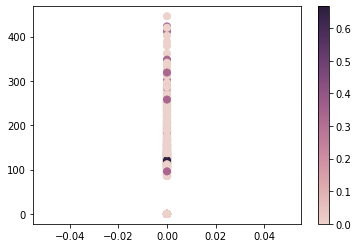

In [200]:
import seaborn as sns
cmap = sns.cubehelix_palette(as_cmap=True)
f, ax = plt.subplots()
points = ax.scatter(X_val[:, 0], X_val[:, 1], c=test_preds, s=50, cmap=cmap)
f.colorbar(points)
plt.show()

#Gaussian Naive Bayes

In [201]:
# Gaussian Naive Bayes

gaussian = GaussianNB()
gaussian.fit(X_train, y_train)
Y_pred = gaussian.predict(X_val)
acc_gaussian = round(gaussian.score(X_train, y_train) * 100, 2)
acc_gaussian

100.0

In [202]:
yt_p = gaussian.predict(X_train)
yv_p = gaussian.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))

Training Accuracy 1.0
Validation  Accuracy 1.0


In [203]:
gaussian.fit(X_train1, y_train)
yt_p = gaussian.predict(X_train1)
yv_p = gaussian.predict(X_val1)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))

Training Accuracy 1.0
Validation  Accuracy 1.0


#Random Forest

In [204]:
# Random Forest
random_forest = RandomForestClassifier(n_estimators=100)
random_forest.fit(X_train, y_train)
Y_pred = random_forest.predict(X_val)
random_forest.score(X_train, y_train)
acc_random_forest = round(random_forest.score(X_train, y_train) * 100, 2)
acc_random_forest

100.0

In [205]:
yt_p = random_forest.predict(X_train)
yv_p = random_forest.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))

Training Accuracy 1.0
Validation  Accuracy 0.9986666666666667


In [206]:
random_forest.fit(X_train1, y_train)
yt_p = random_forest.predict(X_train1)
yv_p = random_forest.predict(X_val1)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))

Training Accuracy 1.0
Validation  Accuracy 0.9866666666666667


#Decision Tree

[Text(0.5, 0.9166666666666666, 'spectral_centroids_mean <= 3801.689\ngini = 0.104\nsamples = 2498\nvalue = [2361, 137]'),
 Text(0.3, 0.75, 'area_campus <= 0.5\ngini = 0.072\nsamples = 2437\nvalue = [2346, 91]'),
 Text(0.2, 0.5833333333333334, 'gini = 0.0\nsamples = 1666\nvalue = [1666, 0]'),
 Text(0.4, 0.5833333333333334, 'in_out_indoor <= 0.5\ngini = 0.208\nsamples = 771\nvalue = [680, 91]'),
 Text(0.3, 0.4166666666666667, 'spot_square <= 0.5\ngini = 0.375\nsamples = 364\nvalue = [273, 91]'),
 Text(0.2, 0.25, 'spot_library <= 0.5\ngini = 0.483\nsamples = 223\nvalue = [132, 91]'),
 Text(0.1, 0.08333333333333333, 'gini = 0.0\nsamples = 91\nvalue = [0, 91]'),
 Text(0.3, 0.08333333333333333, 'gini = 0.0\nsamples = 132\nvalue = [132, 0]'),
 Text(0.4, 0.25, 'gini = 0.0\nsamples = 141\nvalue = [141, 0]'),
 Text(0.5, 0.4166666666666667, 'gini = 0.0\nsamples = 407\nvalue = [407, 0]'),
 Text(0.7, 0.75, 'area_campus <= 0.5\ngini = 0.371\nsamples = 61\nvalue = [15, 46]'),
 Text(0.6, 0.58333333333

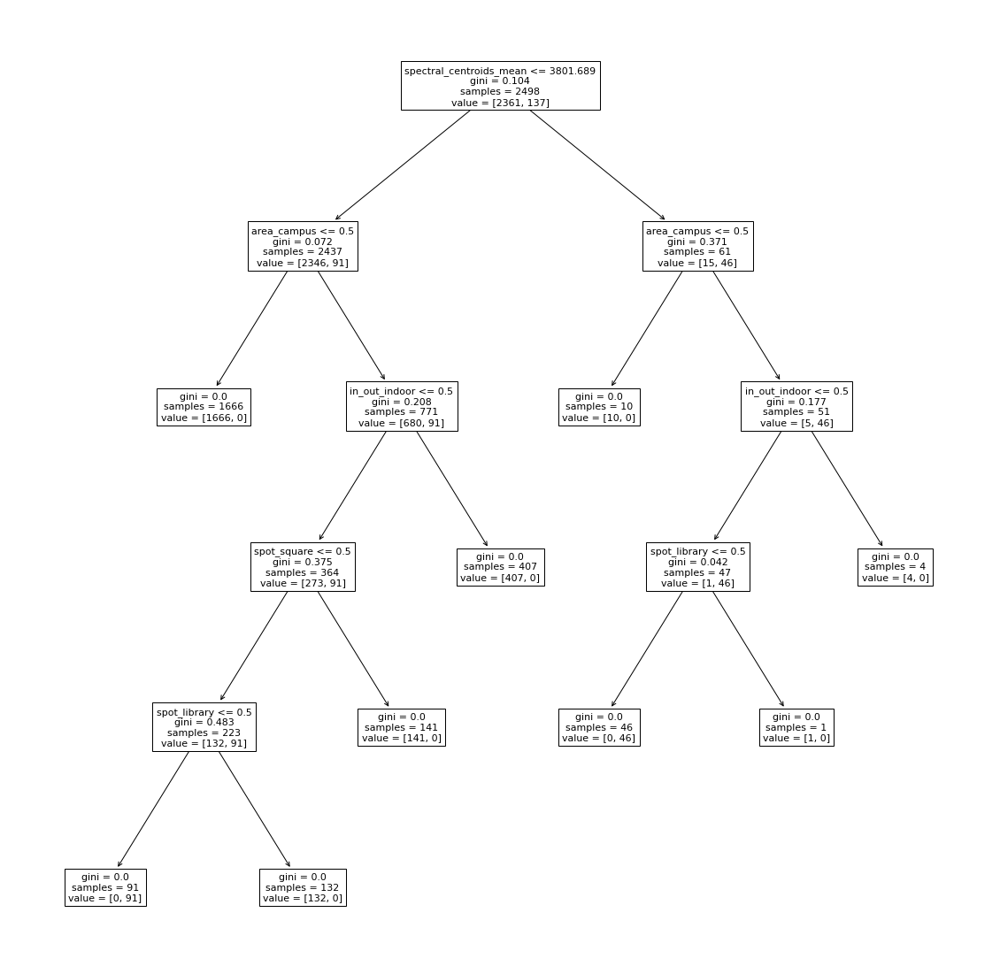

In [207]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
x_dtree = data.drop(['yi'], axis = 1)
dtree = DecisionTreeClassifier()
dtree = dtree.fit(x_dtree, y_data)
import matplotlib.pyplot as plt

plt.figure(figsize = (20,20))
tree.plot_tree(dtree, feature_names=x_dtree.columns)

# 7 Methodology

#Methodology used: 

*  **Logistic Regression** : Here we use to deduce the probability of certain outcomes

**Advantages**: Logistic regression is designed for this purpose (classification), and is most useful for understanding the influence of several independent variables on a single outcome variable.

**Disadvantages**: Works only when the predicted variable is binary, assumes all predictors are independent of each other and assumes data is free of missing values.


The methododoly we will opt for is Logistic regression. We will also check the features that are least important for this model.

#Logistic Regression

In [208]:
logreg = LogisticRegression()
logreg.fit(X_train,y_train)
acc_log = round(logreg.score(X_train, y_train) * 100, 2)
print("Accuracy optained: ", acc_log)

Accuracy optained:  97.65


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [209]:
yt_p = logreg.predict(X_train)
yv_p = logreg.predict(X_val)

print('Validation  Accuracy', np.mean(yv_p==y_val))

Validation  Accuracy 0.976


In [210]:
logreg.fit(X_train1,y_train)
yt_p = logreg.predict(X_train1)
yv_p = logreg.predict(X_val1)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))

Training Accuracy 0.9439359267734554
Validation  Accuracy 0.948


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[[705   6]
 [ 12  27]]


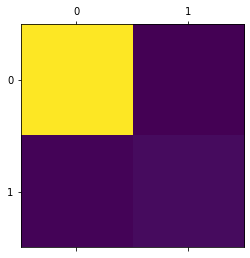

In [211]:
# Making the Confusion Matrix
# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_cm = sc.fit_transform(X_train)
X_val_cm = sc.transform(X_val)

# Fitting Logistic Regression to the Training set
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_val)

# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_val, y_pred)
print(cm)
plt.matshow(cm)
plt.show()



*   Precision: Correct positive predictions relative to total positive predictions
*   Recall: Correct positive predictions relative to total actual positives

In [212]:
from sklearn import metrics
#print precision value of model
print("print precision value of model: ",round(metrics.precision_score(y_val, y_pred),5))

#print recall value of model
print("recall value of model: ",metrics.recall_score(y_val, y_pred))

print precision value of model:  0.81818
recall value of model:  0.6923076923076923


### Features that are insignificant in this Model feature elimination and Modelling

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


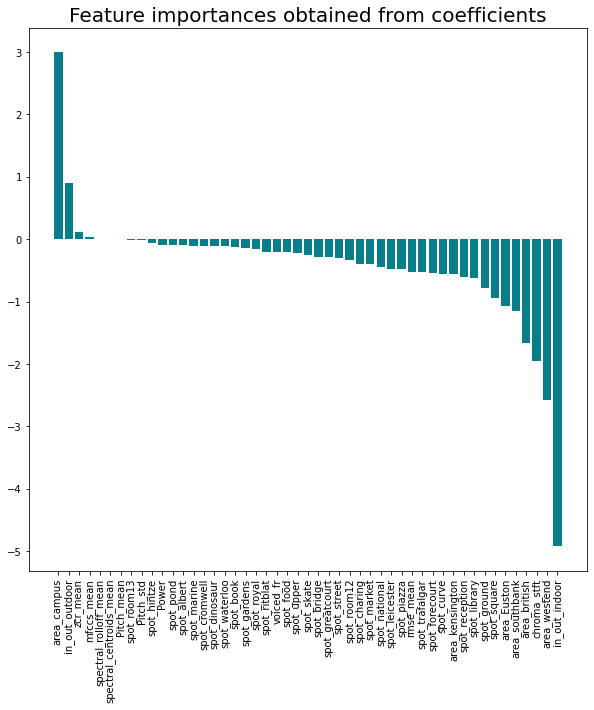

In [213]:
X_train_scaled, X_val_scaled, y_train_scaled, y_val_scaled = train_test_split(data.drop(['yi'], axis = 1),data['yi'],test_size=0.3)
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train_scaled, y_train_scaled)
importances = pd.DataFrame(data={
    'Attribute': X_train_scaled.columns,
    'Importance': model.coef_[0]
})
importances = importances.sort_values(by='Importance', ascending=False)
plt.figure(figsize = (10,10))
plt.bar(x=importances['Attribute'], height=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [214]:
print("Features as per importance: ", importances[importances['Importance']==0])
feature_remove = importances[importances['Importance']==0]
print(feature_remove.Attribute.values.tolist())

Features as per importance:  Empty DataFrame
Columns: [Attribute, Importance]
Index: []
[]


# 8 Results

#Calculating pvalue and selecting predictors

In [215]:
#Backward Elimination
import statsmodels.api as sm
data_x = data.drop('yi', axis = 1)
data_y = data['yi']
cols = list(data_x.columns)
pmax = 1
while (len(cols)>0):
    p= []
    X_1 = data_x[cols]
    X_1 = sm.add_constant(X_1)
    model = sm.OLS(y,X_1).fit()
    p = pd.Series(model.pvalues.values[1:],index = cols)      
    pmax = max(p)
    feature_with_p_max = p.idxmax()
    if(pmax>0.05):
        cols.remove(feature_with_p_max)
    else:
        break
selected_features_BE = cols
print(selected_features_BE)

/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future versi

['spectral_rolloff_mean', 'mfccs_mean', 'area_Euston', 'area_british', 'area_campus', 'area_kensington', 'area_southbank', 'area_westend', 'in_out_indoor', 'in_out_outdoor', 'spot_albert', 'spot_book', 'spot_bridge', 'spot_charing', 'spot_cromwell', 'spot_curve', 'spot_dinosaur', 'spot_food', 'spot_forecourt', 'spot_gardens', 'spot_greatcourt', 'spot_ground', 'spot_hintze', 'spot_leicester', 'spot_library', 'spot_marine', 'spot_market', 'spot_national', 'spot_piazza', 'spot_pond', 'spot_reception', 'spot_ritblat', 'spot_room12', 'spot_room13', 'spot_royal', 'spot_skate', 'spot_square', 'spot_street', 'spot_trafalgar', 'spot_upper', 'spot_waterloo']


/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)
/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


In [236]:
data_pval = data[selected_features_BE]

#Applying the model of the new data

[[705   0]
 [  0  45]]
100.0


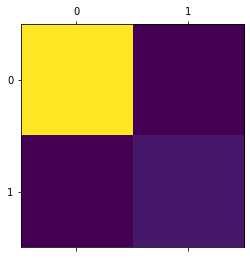

In [231]:
X_train_pval, X_val_pval, y_train_pval, y_val_pval = train_test_split(data_pval,data_y,test_size=0.3)
from sklearn.linear_model import LogisticRegression


# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_pval = sc.fit_transform(X_train_pval)
X_val_pval = sc.transform(X_val_pval)

# Fitting Logistic Regression to the Training set
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_train_pval, y_train_pval)

# Predicting the Test set results
y_pred = classifier.predict(X_val_pval)

# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_val_pval, y_pred)
acc_score = accuracy_score(y_val_pval, y_pred)
print(cm)
print(acc_score*100)
plt.matshow(cm)
plt.show()

In [233]:
from sklearn import metrics
#print precision value of model
print("print precision value of model: ",metrics.precision_score(y_val_pval, y_pred))

#print recall value of model
print("recall value of model: ",metrics.recall_score(y_val_pval, y_pred))

print precision value of model:  1.0
recall value of model:  1.0


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


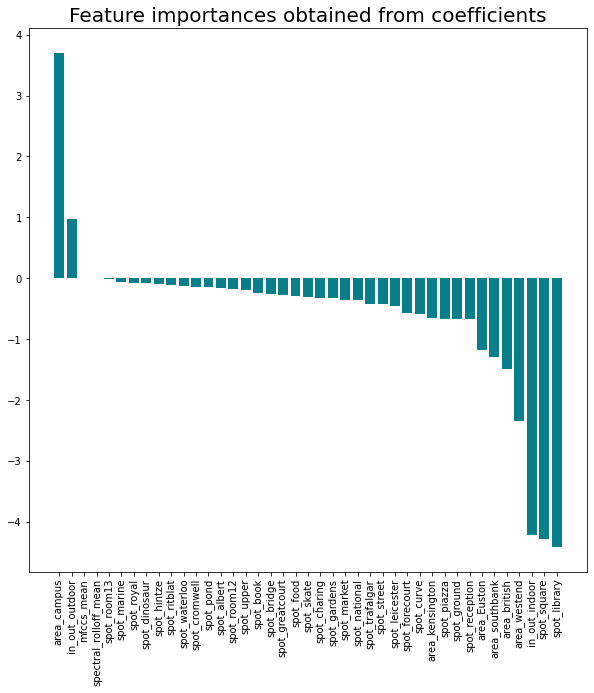

In [234]:
X_train_scaled, X_val_scaled, y_train_scaled, y_val_scaled = train_test_split(data_pval,data_y,test_size=0.3)
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train_scaled, y_train_scaled)
importances = pd.DataFrame(data={
    'Attribute': X_train_scaled.columns,
    'Importance': model.coef_[0]
})
importances = importances.sort_values(by='Importance', ascending=False)
plt.figure(figsize = (10,10))
plt.bar(x=importances['Attribute'], height=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [235]:
print("Features as per importance: ", importances)

Features as per importance:                  Attribute  Importance
4             area_campus    3.703419
9          in_out_outdoor    0.972728
1              mfccs_mean    0.009449
0   spectral_rolloff_mean    0.000311
33            spot_room13   -0.007596
25            spot_marine   -0.056342
34             spot_royal   -0.077013
16          spot_dinosaur   -0.081304
22            spot_hintze   -0.084769
31           spot_ritblat   -0.109410
40          spot_waterloo   -0.126636
14          spot_cromwell   -0.136703
29              spot_pond   -0.140363
10            spot_albert   -0.156540
32            spot_room12   -0.176501
39             spot_upper   -0.184158
11              spot_book   -0.242860
12            spot_bridge   -0.262149
20        spot_greatcourt   -0.273493
17              spot_food   -0.281535
35             spot_skate   -0.301842
13           spot_charing   -0.318913
19           spot_gardens   -0.328225
26            spot_market   -0.354303
27          spot_nati

*That is because the Decision Tree does not give us a 100% certain answer. It is based on the probability of an outcome,* and the answer will vary.

# 9 Conclusions

Your conclusions, improvements, etc should go here